# NDT Internet Speed Prediction using Deep Learning

**Author:** Wen Bo Li and Patricia Wei

**Date:** May 19, 2023


# Set up authentication

Run this to approve Colab to use your Google credentials.

In [319]:
try: auth
except: 
  !apt update
  !pip install pandas google-cloud-storage

  import pandas as pd
  from google.colab import auth

print (pd.__version__)
auth.authenticate_user()

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease
Get:3 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease [18.1 kB]
Hit:4 http://archive.ubuntu.com/ubuntu focal InRelease
Get:5 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Get:6 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Hit:7 http://ppa.launchpad.net/cran/libgit2/ubuntu focal InRelease
Hit:8 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal InRelease
Get:9 http://archive.ubuntu.com/ubuntu focal-backports InRelease [108 kB]
Hit:10 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu focal InRelease
Hit:11 http://ppa.launchpad.net/ubuntugis/ppa/ubuntu focal InRelease
Get:12 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal/main Sources [2,588 kB]
Get:13 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal/main amd64 Packages [1,221 kB]
Fetch

# Getting the Raw Data

## Imports/utilities for Queries

In [320]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
from scipy import stats
import re
import statistics

import seaborn as sns
import matplotlib as mpl

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import FormatStrFormatter
from matplotlib.pyplot import figure

from datetime import datetime
from datetime import date
from datetime import timedelta
from dateutil.parser import parse as dateparser
import pytz
from pytz import timezone

from collections import defaultdict

import warnings
warnings.filterwarnings('ignore')

utc_tz = pytz.timezone('UTC')

## Helpers

In [321]:
def get_dists(df, col):
  # Frequency
  stats_df = df \
  .groupby(col) \
  [col] \
  .agg('count') \
  .pipe(pd.DataFrame) \
  .rename(columns = {col: 'frequency'})

  # PDF
  stats_df['pdf'] = stats_df['frequency'] / sum(stats_df['frequency'])

  # CDF
  stats_df['cdf'] = stats_df['pdf'].cumsum()
  stats_df = stats_df.reset_index()
  return stats_df

## Query Parameters


In [322]:
start_date = '2023-02-01'
end_date = '2023-02-03'

start_time = f'{start_date} 00:00:00 UTC'
end_time = f'{end_date} 23:59:59 UTC'
start_time_dt = datetime.strptime(start_time, '%Y-%m-%d %H:%M:%S UTC')
end_time_dt = datetime.strptime(end_time, '%Y-%m-%d %H:%M:%S UTC')

num_days = 1
min_datapoints = 1
min_daily_datapoints = 1
min_duration = 1 #seconds

mlab_project = 'measurement-lab'

## Very Small Query Parameters so the query actually finishes

In [323]:
start_date = '2023-02-01'
end_date = '2023-02-01'

start_time = f'{start_date} 12:00:00 UTC'
end_time = f'{end_date} 12:00:59 UTC'
start_time_dt = datetime.strptime(start_time, '%Y-%m-%d %H:%M:%S UTC')
end_time_dt = datetime.strptime(end_time, '%Y-%m-%d %H:%M:%S UTC')

num_days = 1
min_datapoints = 1
min_daily_datapoints = 1
min_duration = 1 #seconds

mlab_project = 'measurement-lab'

## Query

### Subqueries

In [324]:
def get_bytes_sample(bytes_MB):
  return f'''
bytes_sample_{bytes_MB}MB AS (
  SELECT
    UUID,
    ARRAY (
      SELECT
        AS STRUCT *
      FROM
        UNNEST(Snapshots)
      WHERE
        BytesAcked < {bytes_MB*1e6}
      ORDER BY
        BytesAcked DESC
    ) AS Snapshots_sample
  FROM
    preprocessed
),
bytes_cum_sample_{bytes_MB}MB AS (
  SELECT
    UUID,
  IF
    (ARRAY_LENGTH(Snapshots_sample) > 0,
        Snapshots_sample[OFFSET(0)].CumAvgMbps, -1) AS Cum_Estimates_{bytes_MB}MB
  FROM
    bytes_sample_{bytes_MB}MB
),
bytes_p5_sample_{bytes_MB}MB AS (
  WITH
    tmp AS (
      SELECT
        UUID,
        APPROX_QUANTILES(CurrAvgMbps, 100)[OFFSET(5)] AS p5
      FROM
        bytes_sample_{bytes_MB}MB, UNNEST(Snapshots_sample)
      GROUP BY
        UUID
    )
  SELECT
    bytes_sample_{bytes_MB}MB.UUID,
    AVG(CurrAvgMbps) AS Sampled_Estimates_{bytes_MB}MB
  FROM
    bytes_sample_{bytes_MB}MB, UNNEST(Snapshots_sample)
  JOIN
    tmp
  ON
    tmp.UUID = bytes_sample_{bytes_MB}MB.UUID
  WHERE
    CurrAvgMbps > p5
  GROUP BY
    1
)
'''

def bytes_inner_join(bytes_MB):
  return f'''
INNER JOIN bytes_cum_sample_{bytes_MB}MB
ON bytes_cum_sample_{bytes_MB}MB.UUID = preprocessed.UUID
INNER JOIN bytes_p5_sample_{bytes_MB}MB
ON bytes_p5_sample_{bytes_MB}MB.UUID = preprocessed.UUID
'''

### Simplified Query

In [325]:
def get_data_v3(start_date, end_date, start_time, end_time, min_daily_datapoints, num_days, min_datapoints, min_duration, to_print=False):
  query = f'''
WITH
preprocessed AS (
  SELECT
    ndt7.raw.Download.UUID AS UUID,
    ndt7.raw.ClientIP AS ClientIP,
    ndt7.Server.Site AS Site,
    ndt7.a.TestTime AS TestTime,
    ndt7.a.MeanThroughputMbps AS ReturnedThroughputMbps,
    TIMESTAMP_DIFF(ndt7.raw.Download.EndTime, ndt7.raw.Download.StartTime, SECOND) AS Duration_s,
    (SELECT max(ServerMeasurements.TCPInfo.BytesAcked)
      FROM UNNEST(tcpinfo.raw.Snapshots) AS ServerMeasurements
    ) AS TotalBytesAcked,
    ARRAY (
      (
        SELECT AS STRUCT
          ROW_NUMBER() OVER snaps AS row_num,
          TIMESTAMP_DIFF(SM.Timestamp, SM.FirstTimestamp, MICROSECOND) as ElapsedTime_us,
          BytesAcked,
          IFNULL(TIMESTAMP_DIFF(SM.Timestamp, LAG(SM.Timestamp, 1) OVER snaps, MICROSECOND), 0) AS DeltaTime_us,
          IFNULL(BytesAcked - LAG(SM.BytesAcked, 1) OVER snaps, 0) AS DeltaBytes,
          IFNULL(SAFE_DIVIDE(((BytesAcked - LAG(SM.BytesAcked, 1) OVER snaps)/1e6)*8 , TIMESTAMP_DIFF(SM.Timestamp, LAG(SM.Timestamp, 1) OVER snaps, MICROSECOND)/1e6), 0) AS CurrAvgMbps,
          IFNULL(SAFE_DIVIDE((BytesAcked/1e6)*8, TIMESTAMP_DIFF(SM.Timestamp, FirstTimestamp, MICROSECOND)/1e6), 0) AS CumAvgMbps
        FROM (
          SELECT *
          FROM
            (
              (
                SELECT
                  ServerMeasurements.TCPInfo.BytesAcked,
                  ServerMeasurements.Timestamp
                  FROM
                    UNNEST(tcpinfo.raw.Snapshots) AS ServerMeasurements
              )
                CROSS JOIN
              (
                SELECT
                  MIN(ServerMeasurements.Timestamp) AS FirstTimestamp FROM
                  UNNEST(tcpinfo.raw.Snapshots) AS ServerMeasurements
              )
            )
        ) AS SM
        WINDOW 
          snaps AS (ORDER BY SM.Timestamp)
      )
    ) AS Snapshots
FROM
  `measurement-lab.ndt.tcpinfo` AS tcpinfo
INNER JOIN
  `measurement-lab.ndt.ndt7` AS ndt7
ON ndt7.raw.Download.UUID = tcpinfo.raw.MetaData.UUID
INNER JOIN
  `measurement-lab.ndt.unified_downloads` AS unified_downloads
ON unified_downloads.a.UUID = tcpinfo.raw.MetaData.UUID
  WHERE
    (ndt7.date BETWEEN '{start_date}' AND '{end_date}')
    AND (tcpinfo.date BETWEEN '{start_date}' AND '{end_date}')
    AND (unified_downloads.date BETWEEN '{start_date}' AND '{end_date}')
    AND ndt7.a.TestTime >= TIMESTAMP('{start_time}')
    AND ndt7.a.TestTime <= TIMESTAMP('{end_time}')
)

SELECT
  preprocessed.UUID,
  preprocessed.ClientIP,
  Site,
  TestTime,
  TotalBytesAcked,
  Duration_s,
  ReturnedThroughputMbps,
  Snapshots
FROM
  preprocessed
WHERE
  ARRAY_LENGTH(preprocessed.Snapshots) > 0
  AND Duration_s > {min_duration}
'''

  if to_print:
    print(query)
  return pd.read_gbq(query, project_id=mlab_project)

### Make the Query

In [326]:
df_v3 = get_data_v3(start_date, end_date, start_time, end_time, min_daily_datapoints, num_days, min_datapoints, min_duration, to_print=False)

In [327]:
df_v3['Cum_Estimate_full'] = (df_v3.TotalBytesAcked/df_v3.Duration_s)/1e6

## Total tests
print(f"{len(df_v3)} tests")
print(f"{len(df_v3.ClientIP.unique())} client IPs")

2939 tests
2529 client IPs


## Bytes per test (sanity check of data)

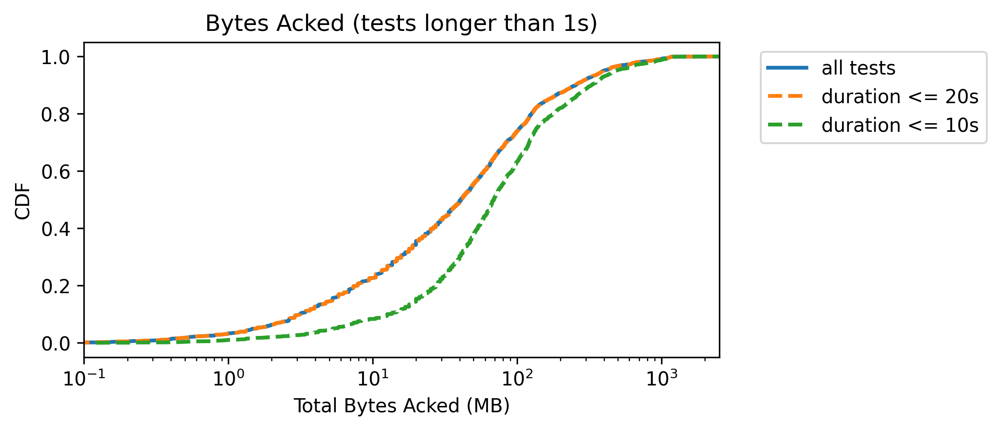

In [328]:
data_dist = get_dists(df_v3, 'TotalBytesAcked')
data_dist_lt20s = get_dists(df_v3[df_v3.Duration_s <= 20], 'TotalBytesAcked')
data_dist_lt10s = get_dists(df_v3[df_v3.Duration_s <= 10], 'TotalBytesAcked')

fig, ax = plt.subplots(dpi=300, figsize=(6,3))
ax.plot(data_dist.TotalBytesAcked/1e6, data_dist.cdf, linewidth=2, label='all tests')
ax.plot(data_dist_lt20s.TotalBytesAcked/1e6, data_dist_lt20s.cdf, linewidth=2, linestyle='--', label='duration <= 20s')
ax.plot(data_dist_lt10s.TotalBytesAcked/1e6, data_dist_lt10s.cdf, linewidth=2, linestyle='--', label='duration <= 10s')

ax.set_xscale('log')
ax.set_xlim(0.1, max(df_v3.TotalBytesAcked)/1e6)
ax.set_xlabel('Total Bytes Acked (MB)')
ax.set_ylabel("CDF")
ax.set_title(f"Bytes Acked (tests longer than {min_duration}s)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

print()

In [329]:
print(f"Most bytes transferred {max(df_v3.TotalBytesAcked)/1e6}MB")

Most bytes transferred 2526.393583MB


## Time series of a single test

In [330]:
print(df_v3.keys())
dp = df_v3
print("dp.TotalBytesAcked", dp.TotalBytesAcked[0])
print("dp.Duration_s", dp.Snapshots[0][-1]["ElapsedTime_us"], dp.Snapshots[1][-1]["ElapsedTime_us"])
print("# of snapshots", len(dp.Snapshots[0]), len(dp.Snapshots[1]))
print("avg throughput:", dp.TotalBytesAcked[0] * 8 / dp.Duration_s[0] / 1e6)
print("returned mean throughput:", dp.ReturnedThroughputMbps[0])
dp["Snapshots"][8]
#dp["Snapshots"][1][:10]

# Observations
# 1. Delta between timestamps are not uniform and not predictable.
# 2. Total test time is not constant.
# 3. Total number of snapshots is not constant.
# 4. "ReturnedThroughputMbps" does NOT match a naive (Bytes/ElapsedTime) computation.
#   4a. Question: is ReturnedThroughputMbps the ground truth?

Index(['UUID', 'ClientIP', 'Site', 'TestTime', 'TotalBytesAcked', 'Duration_s',
       'ReturnedThroughputMbps', 'Snapshots', 'Cum_Estimate_full'],
      dtype='object')
dp.TotalBytesAcked 14717210
dp.Duration_s 14689565 16950118
# of snapshots 133 9
avg throughput: 9.811473333333334
returned mean throughput: 8.30459748535


array([{'row_num': 1, 'ElapsedTime_us': 0, 'BytesAcked': 0, 'DeltaTime_us': 0, 'DeltaBytes': 0, 'CurrAvgMbps': 0.0, 'CumAvgMbps': 0.0},
       {'row_num': 2, 'ElapsedTime_us': 169826, 'BytesAcked': 17613, 'DeltaTime_us': 169826, 'DeltaBytes': 17613, 'CurrAvgMbps': 0.8296962773662454, 'CumAvgMbps': 0.8296962773662454},
       {'row_num': 3, 'ElapsedTime_us': 270243, 'BytesAcked': 17613, 'DeltaTime_us': 100417, 'DeltaBytes': 0, 'CurrAvgMbps': 0.0, 'CumAvgMbps': 0.5213974089985679},
       {'row_num': 4, 'ElapsedTime_us': 369943, 'BytesAcked': 59953, 'DeltaTime_us': 99700, 'DeltaBytes': 42340, 'CurrAvgMbps': 3.397392176529589, 'CumAvgMbps': 1.2964808092057425},
       {'row_num': 5, 'ElapsedTime_us': 469933, 'BytesAcked': 74553, 'DeltaTime_us': 99990, 'DeltaBytes': 14600, 'CurrAvgMbps': 1.1681168116811682, 'CumAvgMbps': 1.2691681580140146},
       {'row_num': 6, 'ElapsedTime_us': 579562, 'BytesAcked': 76013, 'DeltaTime_us': 109629, 'DeltaBytes': 1460, 'CurrAvgMbps': 0.10654115243229437, '

### Plots of Multiple tests

In [331]:
def plot_snapshots(snapshots, returnedthroughputs, rows, cols, truncate=0, predictedthroughputs=[], predictedvars=[]):
  plotX = rows
  plotY = cols

  figure(figsize=(plotY * 2, plotX * 2))

  for i in range(plotX):
    for j in range(plotY):
      index = i * plotY + j
      data = snapshots[index]
      series = []
      timestamps = []
      for k, snapshot in enumerate(data):
        if truncate > 0 and k == truncate:
          break
        timestamps.append(snapshot["ElapsedTime_us"] / 1e6)
        series.append(snapshot["CurrAvgMbps"])

      plt.subplot(plotX, plotY, index+1)
      plt.plot(timestamps, series)
      plt.axhline(returnedthroughputs[index], color='r')
      if len(predictedthroughputs) > 0 and len(predictedvars) > 0:
        # Plot variance
        plt.axhline(predictedthroughputs[index]-predictedvars[index], color='g')
        plt.axhline(predictedthroughputs[index]+predictedvars[index], color='g')
      elif len(predictedthroughputs) > 0:
        plt.axhline(predictedthroughputs[index], color='g')

Index(['UUID', 'ClientIP', 'Site', 'TestTime', 'TotalBytesAcked', 'Duration_s',
       'ReturnedThroughputMbps', 'Snapshots', 'Cum_Estimate_full'],
      dtype='object')


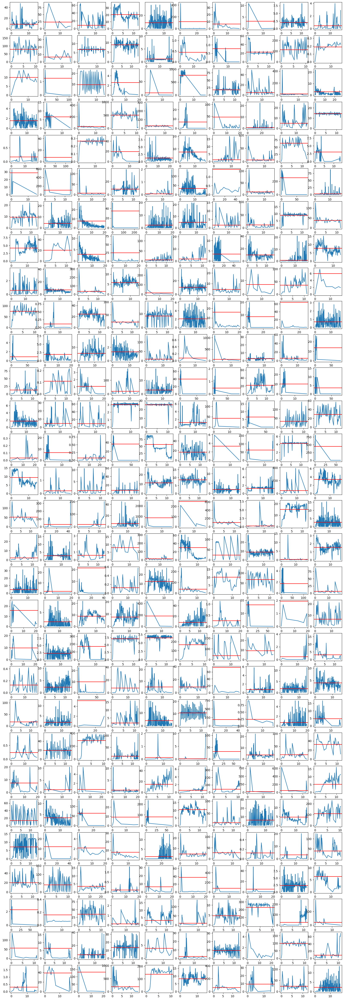

In [332]:
print(df_v3.keys())
plot_snapshots(df_v3.Snapshots, df_v3.ReturnedThroughputMbps, 30, 10)

# First model -- baseline

The first model will be just use the first INPUT_TRUNCATE_SNAPSHOTS datapoints. If there are less than MINIMUM_SNAPSHOTS datapoints in total then the test will not be used.

## Imports/Utilities for Tensorflow

In [333]:
import h5py
import numpy as np
import tensorflow as tf
import tensorflow_probability as tfp
import matplotlib.pyplot as plt
from tensorflow.python.framework.ops import EagerTensor
from tensorflow.python.ops.resource_variable_ops import ResourceVariable
import time

tfpl = tfp.layers
tfd = tfp.distributions

tf.__version__

'2.12.0'

## Utilities for Creating training/dev/test

### Visualizing how many snaphots each test has

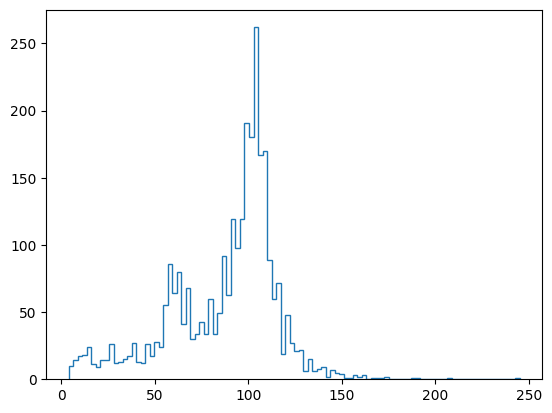

In [334]:
frequencies = []
for snapshots in df_v3.Snapshots:
  frequencies.append(len(snapshots))

counts, bins = np.histogram(frequencies, bins=100)
plt.stairs(counts, bins)

#### get_valid_serieses

In [335]:
# INPUT_TRUNCATE_SNAPSHOTS is the number of snapshots with which we will predict
# the final bandwidth.
#########INPUT_TRUNCATE_SNAPSHOTS = 80
# MINIMUM_SNAPSHOTS is an important number: it filters the dataset such that
# only the tests with at least this many number of datapoints is given a
# prediction.
#
# We can tweak this number such that only, say, tests with 50, or 70 datapoints
# are retained as "good tests". In order to do that though we would need a good
# rationale.
#########MINIMUM_SNAPSHOTS = 80

truncateNs = list(range(30, 51, 10))

# get_valid_serieses returns all tests that contains the minimum number of snapshots
def get_valid_serieses(minSnapshotsN):
  valid_serieses = []
  valid_returnedthroughputs = []
  for i in range(len(df_v3.Snapshots)):
    if len(df_v3.Snapshots[i]) >= minSnapshotsN:
      valid_serieses.append(df_v3.Snapshots[i])
      valid_returnedthroughputs.append(df_v3.ReturnedThroughputMbps[i])
  return valid_serieses, valid_returnedthroughputs

### Visualizing tests with `MINIMUM_SNAPSHOTS`



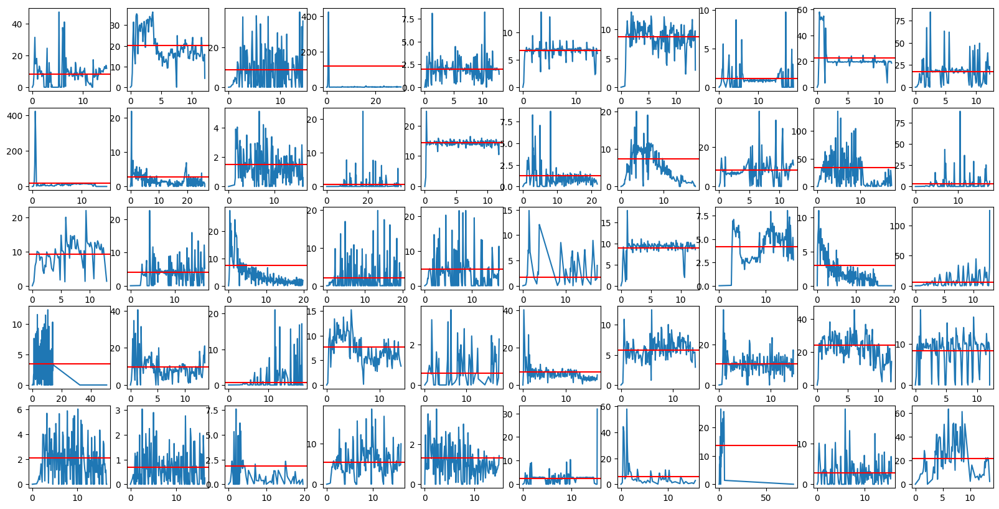

In [336]:
# Whether to enable printing the visualizations
# NOTE: There is a separate flag for the later result visualizations for convenience.
plot_visualization = True

if plot_visualization:
  SNAPSHOT_TRUNC_FOR_VISUALIZATION = truncateNs[-1]
  valid_serieses, valid_returnedthroughputs = get_valid_serieses(SNAPSHOT_TRUNC_FOR_VISUALIZATION)
  plot_snapshots(valid_serieses, valid_returnedthroughputs, 5, 10)

### Visualizing tests with `MINIMUM_SNAPSHOTS` and truncated with `INPUT_TRUNCATE_SNAPSHOTS`


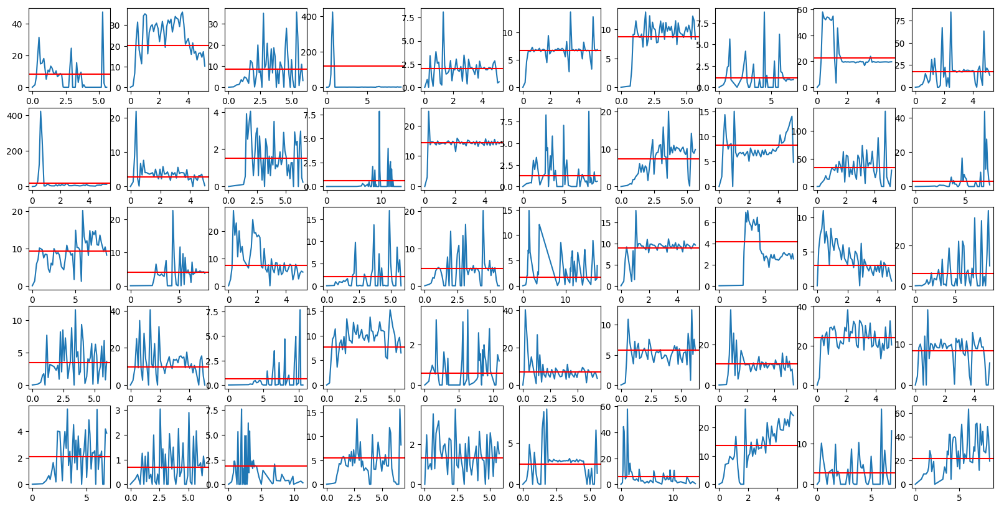

In [337]:
if plot_visualization:
  plot_snapshots(valid_serieses, valid_returnedthroughputs, 5, 10, truncate=SNAPSHOT_TRUNC_FOR_VISUALIZATION)

### Truncate and Create training/dev/test 

In [338]:
### Normalization idea: normalize everything to have the same range, but don't
### touch standard deviation or the mean (other than the range lower the mean
### proportionally).
def normalize(x, y):
  maxes = x.max(axis=1, keepdims=True)
  x /= maxes
  maxes = maxes.squeeze()
  y /= maxes

  def denormalize(y_norm):
    return y_norm * maxes
  return x, y, denormalize

def split_datasets(valid_serieses, valid_returnedthroughputs, truncateN, debug=False):
  onedim_valid_serieses = []
  labels = valid_returnedthroughputs
  for series in valid_serieses:
    onedim_series = []
    for snapshot in series[:truncateN]:
      onedim_series.append(snapshot["CurrAvgMbps"])
    onedim_valid_serieses.append(onedim_series)

  onedim_valid_serieses = np.asarray(onedim_valid_serieses)
  labels = np.asarray(labels).T

  TrainingSetEndIndex = round(len(onedim_valid_serieses) * 0.8)
  DevSetEndIndex = round(TrainingSetEndIndex + len(onedim_valid_serieses) * 0.1)
  TestSetEndIndex = len(onedim_valid_serieses)

  training_set = onedim_valid_serieses[:TrainingSetEndIndex]
  training_set_labels = labels[:TrainingSetEndIndex]
  dev_set = onedim_valid_serieses[TrainingSetEndIndex:DevSetEndIndex]
  dev_set_labels = labels[TrainingSetEndIndex:DevSetEndIndex]
  test_set = onedim_valid_serieses[DevSetEndIndex:]
  test_set_labels = labels[DevSetEndIndex:]

  training_set_unnorm, training_set_labels_unnorm = training_set.copy(), training_set_labels.copy()
  dev_set_unnorm, dev_set_labels_unnorm = dev_set.copy(), dev_set_labels.copy()
  test_set_unnorm, test_set_labels_unnorm = test_set.copy(), test_set_labels.copy()

  training_set, training_set_labels, denormalize_training = normalize(training_set, training_set_labels)
  dev_set, dev_set_labels, denormalize_dev = normalize(dev_set, dev_set_labels)
  test_set, test_set_labels, denormalize_test = normalize(test_set, test_set_labels)

  return training_set, training_set_labels, denormalize_training, training_set_labels_unnorm, dev_set, dev_set_labels, denormalize_dev, dev_set_labels_unnorm, test_set, test_set_labels, denormalize_test, test_set_labels_unnorm

## Multi-level Perceptron Model (initial model)

#### Get Data Function

In [339]:
# These maps are for visualization
valid_serieses_map, valid_returnedthroughputs_map = {}, {}

def get_input(minSnapshotN, truncateN, debug=False):
  valid_serieses, valid_returnedthroughputs = get_valid_serieses(minSnapshotN)
  valid_serieses_map[minSnapshotN], valid_returnedthroughputs_map[minSnapshotN] = valid_serieses, valid_returnedthroughputs
  training_set, training_set_labels, denormalize_training, training_set_labels_unnorm, dev_set, dev_set_labels, denormalize_dev, dev_set_labels_unnorm, test_set, test_set_labels, denormalize_test, test_set_labels_unnorm = split_datasets(valid_serieses, valid_returnedthroughputs, truncateN, debug=debug)
  x_train, y_train, x_dev, y_dev, x_test, y_test = training_set, training_set_labels, dev_set, dev_set_labels, test_set, test_set_labels
  return (
      [x_train, y_train, x_dev, y_dev, x_test, y_test],
      [denormalize_training, denormalize_dev, denormalize_test],
      [training_set_labels_unnorm, dev_set_labels_unnorm, test_set_labels_unnorm]
  )


#### Model

In [407]:
learning_rate = 1e-3
num_epochs = 10
minibatch_size = 1000
enable_JTT = False
JTT_upsample = 10
JTT_cutoff_diff = 0.20
# Note: this is not a hyperparameter, this is the plotting density. The lower
# the number the more computation it has to run and hence the slower the training.
epoch_spacing = 20

event_shape = 1

def nll(y_true, y_pred):
  return -y_pred.log_prob(y_true)

# aleatoric loss function
def aleatoric_loss(y_true, y_pred):
  K = tf.keras.backend
  N = y_true.shape[0]
  lse = K.log(K.pow((y_true[:,0]-y_pred[:,0]),2))
  lvariances = K.log(y_pred[:,1])
  mse = K.mean(K.exp(lse - lvariances))
  reg = K.mean(lvariances)
  print(lse[0])
  print(lvariances[0])
  print(mse)
  print(reg)
  return 0.5*(mse + reg)

variance_penalty = 1

def heteroscedastic_loss(y_true, y_pred):
  mean, var = y_pred[:,0], y_pred[:,1]
  yt = y_true[:, 0]
  loss = tf.reduce_mean(variance_penalty * 0.5 * tf.math.log(var) + 0.5 * tf.math.divide(tf.square(yt - mean), var))
  #loss = tf.reduce_mean(variance_penalty * 0.5 * tf.math.log(var) + 0.5 * tf.math.divide(tf.square(yt - mean), var) + 500 * tf.square(yt - mean))

  #loss = tf.reduce_mean(tf.square(yt - mean))
  #print(yt.shape, mean.shape, var.shape, tf.square(yt - mean).shape)
  return loss

def custom_loss(y_true, y_pred):
  loss = tf.reduce_mean(tf.pow(tf.abs(y_true - y_pred), 1.5))
  return loss

loss = heteroscedastic_loss
#loss = tf.keras.losses.MeanSquaredError()
#loss = tf.keras.losses.MeanAbsoluteError()
#loss = nll
#loss = custom_loss

metrics = [tf.keras.losses.MeanSquaredError()]

W, b, costs, train_acc, test_acc, train_preds, test_preds, training_set_labels_unnorm, dev_set_labels_unnorm, test_set_labels_unnorm = {}, {}, {}, {}, {}, {}, {}, {}, {}, {}

train_preds_sd, test_preds_sd = {}, {}

history = {}

denormalize_training, denormalize_dev, denormalize_test = {}, {}, {}

for truncateN in truncateNs:
  sample_weights = None
  for trainCount in range(1, 3): # Just train twice!
    if not enable_JTT and trainCount == 2:
      continue
    print(f"truncateN: {truncateN}")
    data_np, denorm_funcs, unnorm_labels = get_input(truncateN, truncateN, debug=False)

    x_train_np, y_train_np, x_dev_np, y_dev_np, x_test_np, y_test_np = data_np
    denormalize_training[truncateN], denormalize_dev[truncateN], denormalize_test[truncateN] = denorm_funcs
    training_set_labels_unnorm[truncateN], dev_set_labels_unnorm[truncateN], test_set_labels_unnorm[truncateN] = unnorm_labels

    model = tf.keras.models.Sequential(
        [tf.keras.layers.Input(shape=(truncateN,))]
        + [ tf.keras.layers.Dense(dim, activation=tf.nn.leaky_relu) for dim in [64, 16] ]
        + [ tf.keras.layers.Dense(dim, activation=tf.nn.softplus) for dim in [2] ] # Activation to ensure variance is positive
        #+ [ tf.keras.layers.Dense(tfpl.IndependentNormal.params_size(event_shape=event_shape)) ]
        #+ [ tfpl.DistributionLambda(lambda t: tfd.Normal(loc=t, scale=0.01)) ]
        #+ [ tfpl.DistributionLambda(lambda t: tfd.Normal(loc=t[..., :1],
        #                   scale=1e-3 + tf.math.softplus(0.2 * t[...,1:]))) ]
        #+ [ tfpl.IndependentNormal(event_shape=1) ]
    )

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                  loss=loss,
                  metrics=metrics)
    
    print(f"{x_train_np.shape}, {y_train_np.shape}")
    history[truncateN] = model.fit(
        x_train_np,
        y_train_np,
        validation_data=(x_test_np, y_test_np),
        sample_weight=sample_weights,
        epochs=num_epochs)
  
    train_preds[truncateN] = model.predict(x_train_np).squeeze()
    print(train_preds[truncateN].shape)
    test_preds[truncateN] = model.predict(x_test_np).squeeze()

    if enable_JTT and trainCount == 1: # Reallocate weights
      diffs = np.abs(train_preds[truncateN] - y_train_np) / y_train_np
      new_weights = np.floor(diffs + 1 - JTT_cutoff_diff) * JTT_upsample
      new_weights += 1
      sample_weights = new_weights

      

truncateN: 30
(2220, 30), (2220,)
Epoch 1/10
70/70 [==============================] - 1s 4ms/step - loss: 0.0106 - mean_squared_error: 0.2085 - val_loss: -0.7049 - val_mean_squared_error: 0.1467
Epoch 2/10
70/70 [==============================] - 0s 2ms/step - loss: -0.4460 - mean_squared_error: 0.2023 - val_loss: -0.7957 - val_mean_squared_error: 0.1533
Epoch 3/10
70/70 [==============================] - 0s 2ms/step - loss: -0.4929 - mean_squared_error: 0.1845 - val_loss: -0.7217 - val_mean_squared_error: 0.1370
Epoch 4/10
70/70 [==============================] - 0s 2ms/step - loss: -0.4399 - mean_squared_error: 0.1982 - val_loss: -0.6842 - val_mean_squared_error: 0.1430
Epoch 5/10
70/70 [==============================] - 0s 2ms/step - loss: -0.4935 - mean_squared_error: 0.1868 - val_loss: -0.7606 - val_mean_squared_error: 0.1367
Epoch 6/10
70/70 [==============================] - 0s 2ms/step - loss: -0.5792 - mean_squared_error: 0.1797 - val_loss: -0.7848 - val_mean_squared_error: 0.

In [341]:
model.evaluate(x_test_np, y_test_np, return_dict=True)["loss"]
model.metrics_names

type(train_preds[30][0])
model.summary()

9/9 [==============================] - 0s 2ms/step - loss: -0.4256 - mean_squared_error: 0.0955
Model: "sequential_212"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_668 (Dense)           (None, 64)                3264      
                                                                 
 dense_669 (Dense)           (None, 16)                1040      
                                                                 
 dense_670 (Dense)           (None, 2)                 34        
                                                                 
Total params: 4,338
Trainable params: 4,338
Non-trainable params: 0
_________________________________________________________________


In [342]:
print(train_preds[50])
print(len(train_preds[50]))
print(type(train_preds[50][0]))
print(y_train_np)
#print(truncateN)
sample = model(x_train_np)

[[0.15178101 0.0972572 ]
 [0.7385157  0.09499047]
 [0.31445077 0.06795868]
 ...
 [0.56576097 0.13164783]
 [0.7289562  0.11563899]
 [0.484411   0.09763198]]
2104
<class 'numpy.ndarray'>
[0.17525745 0.55886476 0.24399161 ... 0.62091191 0.52095201 0.40375812]


In [343]:
# print(sample.mean())

In [344]:
# print(sample.stddev())

In [345]:
# m, stddev = sample.mean(), sample.stddev()
# print(m)
# train_preds[30]

In [346]:
# print(sample)

### Loss Plot per iteration

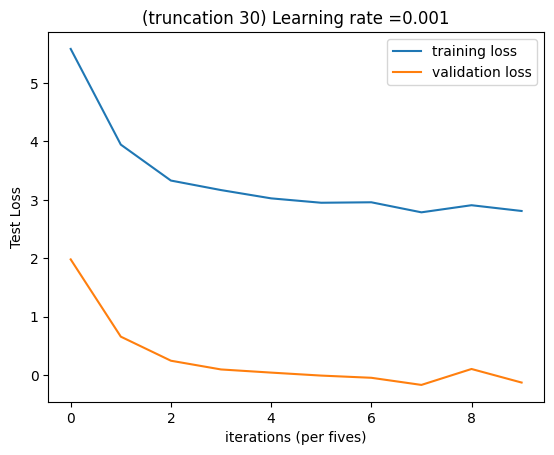

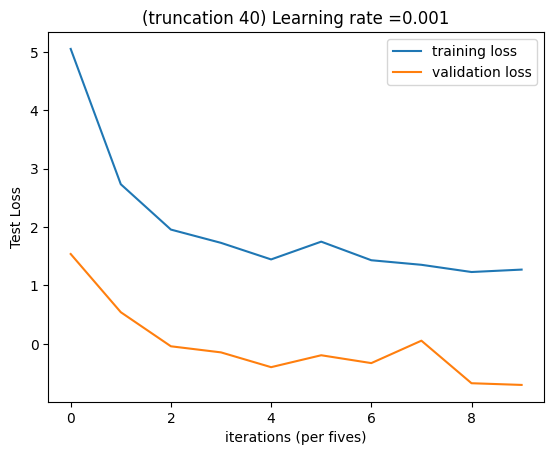

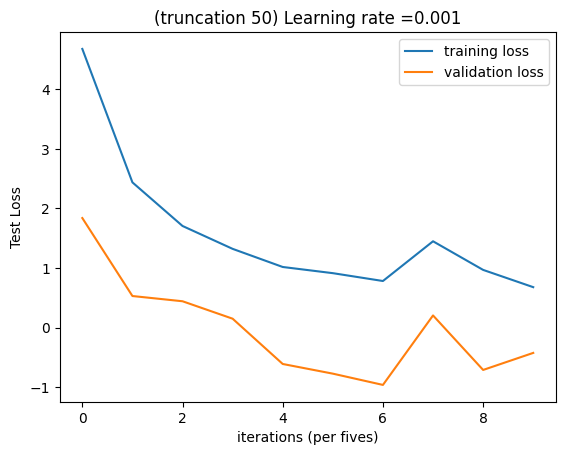

In [347]:
# Plot the train loss
for truncateN in truncateNs:
  plt.plot(np.squeeze(history[truncateN].history["loss"]), label="training loss")
  plt.ylabel('Train Loss')
  plt.xlabel('iterations (per fives)')
  plt.title(f"(truncation {truncateN}) Learning rate =" + str(learning_rate))
  # Plot the test loss
  plt.plot(np.squeeze(history[truncateN].history["val_loss"]), label="validation loss")
  plt.ylabel('Test Loss')
  plt.xlabel('iterations (per fives)')
  plt.title(f"(truncation {truncateN}) Learning rate =" + str(learning_rate))
  plt.legend()
  plt.show()


### Debugging

In [348]:
print(test_preds[SNAPSHOT_TRUNC_FOR_VISUALIZATION].shape)

# DEBUG: This is to check that these two tensors are indeed the same.
#yl = list(y_train.as_numpy_iterator())
#print(yl == training_set_labels)

#print(yl == training_set_labels)

"""

print(training_set_labels_unnorm.shape, train_preds.shape)

def print_samples(n):
  for i in range(n):
    print(training_set_labels_unnorm[i])
    print(train_preds[i])
print("Training set samples")
print_samples(20)

"""

#print(test_set_labels_unnorm[0])
#print(test_preds[0])

(263, 2)


'\n\nprint(training_set_labels_unnorm.shape, train_preds.shape)\n\ndef print_samples(n):\n  for i in range(n):\n    print(training_set_labels_unnorm[i])\n    print(train_preds[i])\nprint("Training set samples")\nprint_samples(20)\n\n'

## Result Visualization

### Unnormalize predictions

In [408]:
train_preds_unnorm, test_preds_unnorm = {}, {}
train_preds_var_unnorm, test_preds_var_unnorm = {}, {}

for truncateN in truncateNs:
  if True:
    train_preds_unnorm[truncateN] = denormalize_training[truncateN](train_preds[truncateN][:, 0])
    test_preds_unnorm[truncateN] = denormalize_test[truncateN](test_preds[truncateN][:, 0])
    train_preds_var_unnorm[truncateN] = denormalize_training[truncateN](train_preds[truncateN][:, 1])
    test_preds_var_unnorm[truncateN] = denormalize_test[truncateN](test_preds[truncateN][:, 1])
  else:
    train_preds_unnorm[truncateN] = denormalize_training[truncateN](train_preds[truncateN])
    test_preds_unnorm[truncateN] = denormalize_test[truncateN](test_preds[truncateN])
    train_preds_var_unnorm[truncateN] = []
    test_preds_var_unnorm[truncateN] = []

  # Shape check
  print(train_preds_unnorm[truncateN].shape)
  print(test_preds_unnorm[truncateN].shape)

(2220,)
(277,)
(2167,)
(271,)
(2104,)
(263,)


### CDF of Accuracy

[ 55.35773969  47.519533    40.91322923  16.54185594  23.95490072
   8.6984685   32.28443303   2.12906343   2.13192758  35.47513339
  24.86296594  40.51043165  34.60272954  37.82725746  21.90548411
  43.99819052  35.9506277   46.92319481  22.18833112  62.28383617
  44.52563338  56.76695551  30.57076076  36.61898375  54.4605558
  44.60600557  63.37982089  44.0217383   43.59962072   7.99674237
   2.94583804  10.11644647  20.55443029  10.47210006   5.14001611
  51.66832258   5.87849491   3.17812871   9.82409909  49.54067078
 113.08419162  17.82872709  42.13138743  50.07577046   6.2375296
  22.42448692  36.42334278  20.6873059   15.1278011   42.6458136
  11.62389197   2.35507253   7.75344334  17.84685552   4.93382026
  26.06813064  34.5526272   43.44680963  15.1375386   43.91282782
  25.25466331  54.01370782  45.37328068   6.87627295   7.92502409
  33.38227204  27.09276893  21.36631203  16.50494868  17.00726387
  19.16082039  15.46214677   7.78385934   3.74735825  13.8794896
   7.31883821 

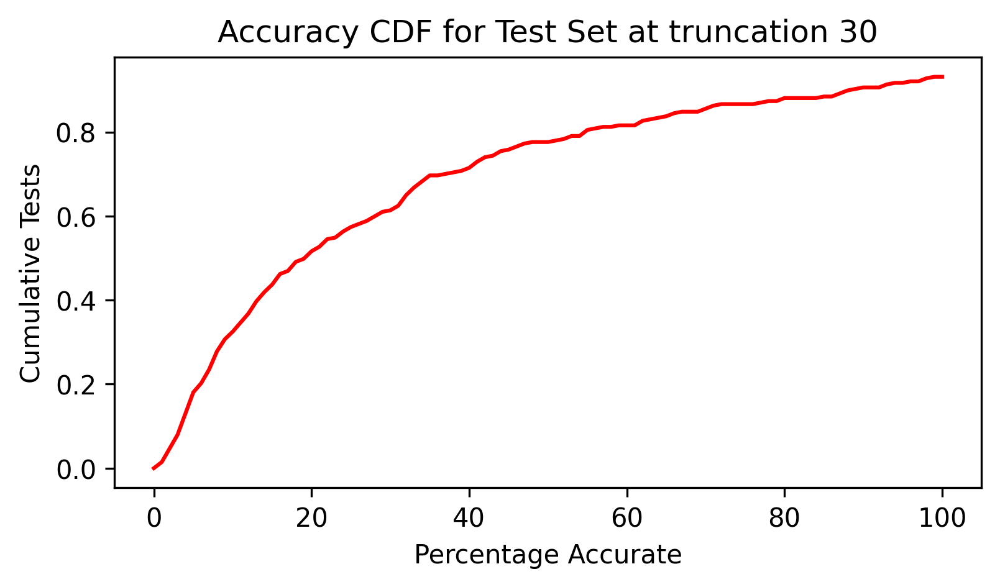

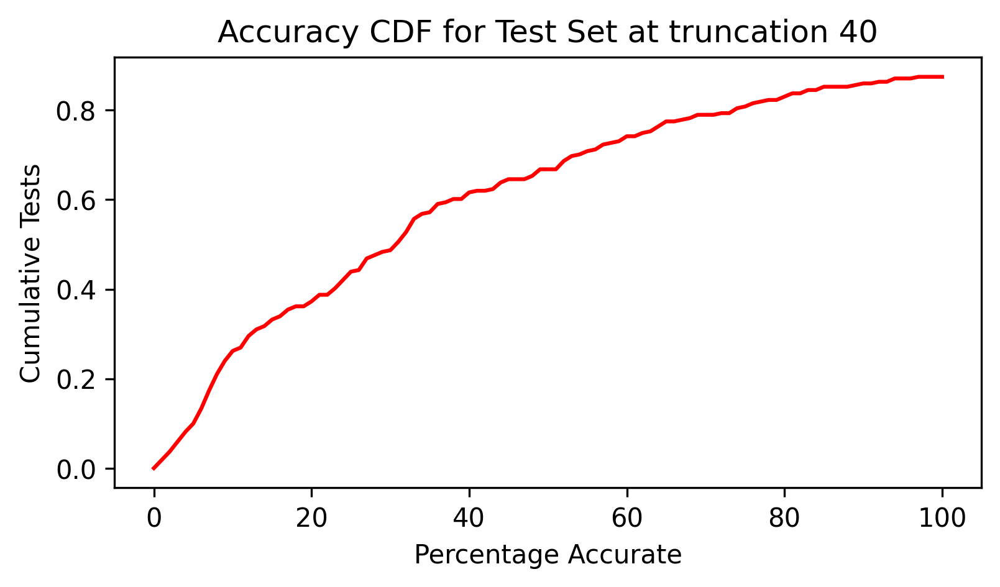

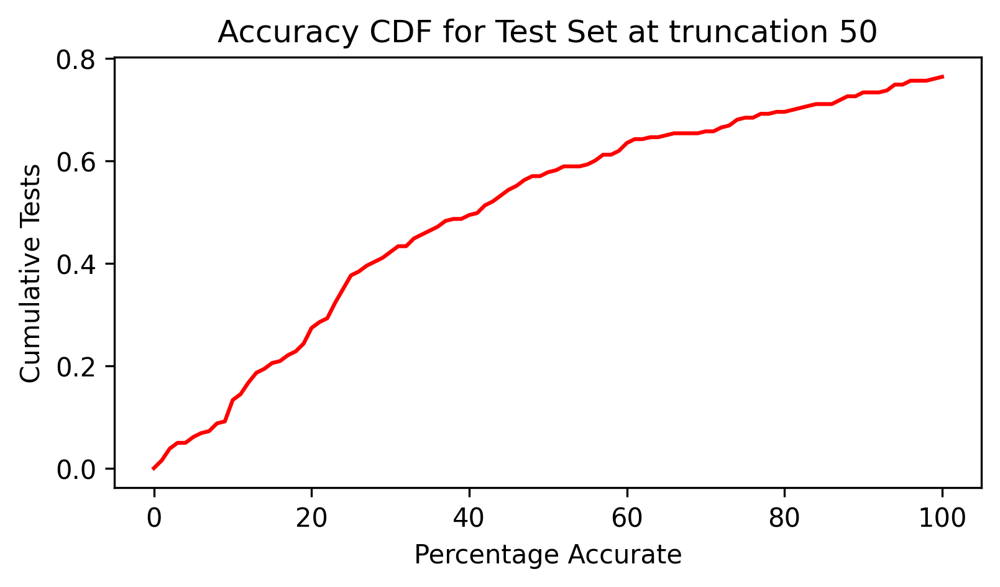

In [409]:
for truncateN in truncateNs:
  print(test_preds_unnorm[truncateN])
  print(test_set_labels_unnorm[truncateN])
  print(test_preds_unnorm[truncateN].shape)
  print(test_set_labels_unnorm[truncateN].shape)
  differences = np.abs(test_set_labels_unnorm[truncateN] - test_preds_unnorm[truncateN]) / test_set_labels_unnorm[truncateN]

  freq = []
  for p in range(101):
    freq.append((differences < 0.01 * p).sum() / len(differences))

  fig, ax = plt.subplots(dpi=300, figsize=(6, 3))

  ax.set_title(f"Accuracy CDF for Test Set at truncation {truncateN}")
  ax.set_xlabel("Percentage Accurate")
  ax.set_ylabel("Cumulative Tests")
  ax.plot(list(range(101)), freq, color='r', label=f"All tests")

### Visualizations for a particular truncation

In [393]:
# Whether to enable printing the visualizations
plot_visualization = True
SNAPSHOT_TRUNC_FOR_VISUALIZATION = 50

#### Training Set

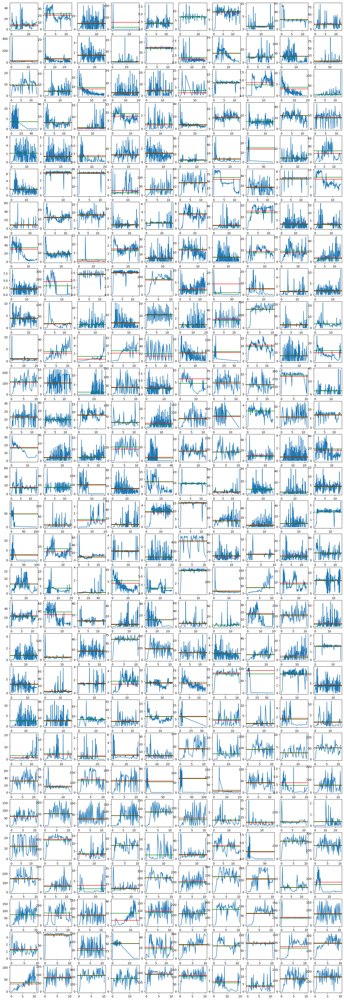

In [394]:
if plot_visualization:
  plot_snapshots(
      valid_serieses_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      valid_returnedthroughputs_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      30, 10,
      predictedthroughputs=train_preds_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      predictedvars=train_preds_var_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION])

#### Training Set with truncation

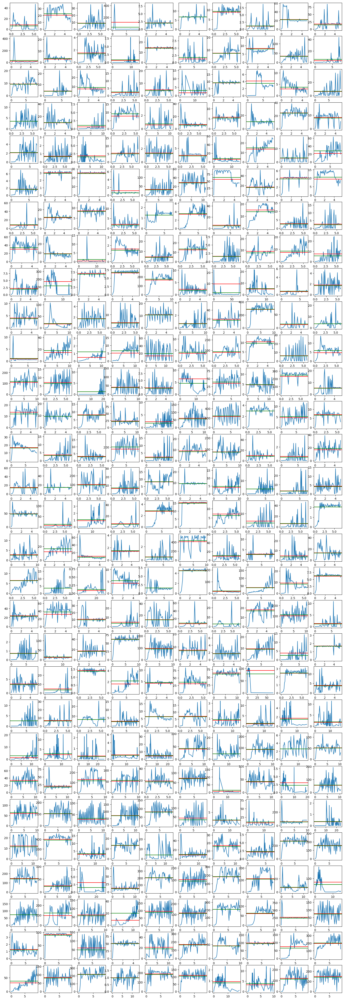

In [395]:
if plot_visualization:
  plot_snapshots(
      valid_serieses_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      valid_returnedthroughputs_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      30, 10,
      truncate=SNAPSHOT_TRUNC_FOR_VISUALIZATION,
      predictedthroughputs=train_preds_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      predictedvars=train_preds_var_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION])

#### Test set

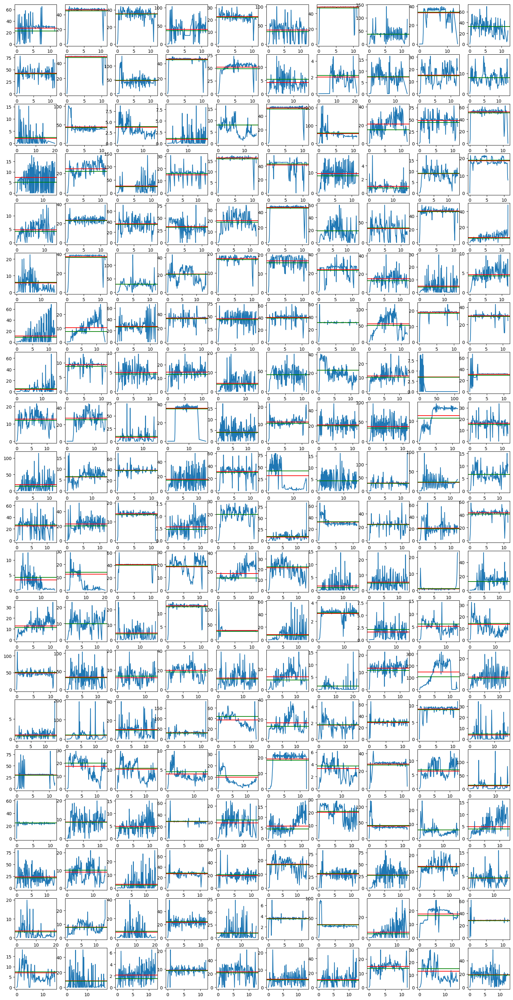

In [396]:
if plot_visualization:
  plot_snapshots(
      valid_serieses_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION][-len(test_preds_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION]):],
      valid_returnedthroughputs_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION][-len(test_preds_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION]):],
      20, 10,
      predictedthroughputs=test_preds_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      predictedvars=test_preds_var_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION])

#### Test set with truncation

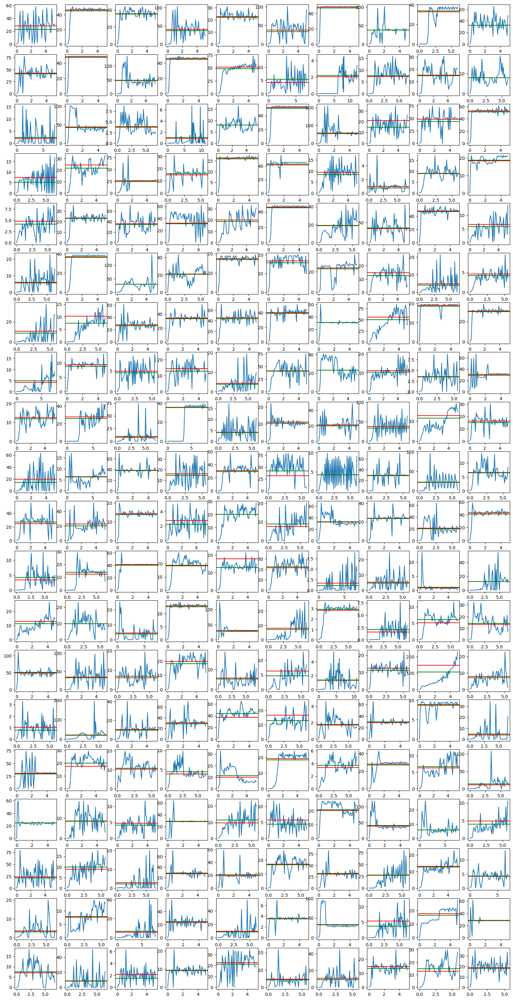

In [397]:
if plot_visualization:
  plot_snapshots(
      valid_serieses_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION][-len(test_preds_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION]):],
      valid_returnedthroughputs_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION][-len(test_preds_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION]):],
      20, 10,
      truncate=SNAPSHOT_TRUNC_FOR_VISUALIZATION,
      predictedthroughputs=test_preds_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      predictedvars=test_preds_var_unnorm[SNAPSHOT_TRUNC_FOR_VISUALIZATION])